<a href="https://colab.research.google.com/github/MVVENTO/NYC_DOT/blob/main/CurbCutsDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Curbcut Dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RVS1EdNU2QXYrUNJFqRw")
project = rf.workspace("nn").project("curb_cuts")
dataset = project.version(2).download("yolov5")

     |████████████████████████████████| 145 kB 12.6 MB/s 
     |████████████████████████████████| 178 kB 31.6 MB/s 
     |████████████████████████████████| 1.1 MB 11.2 MB/s 
     |████████████████████████████████| 67 kB 1.5 MB/s 
     |████████████████████████████████| 54 kB 1.6 MB/s 
     |████████████████████████████████| 138 kB 36.2 MB/s 
     |████████████████████████████████| 596 kB 58.2 MB/s 
     |████████████████████████████████| 63 kB 1.3 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.4-py3-none-any.whl size=21356 sha256=b903617bc7b3e937e1cef5cb97bde78f34c400725ba35fc9df3b92fd54a72d47
  Stored in directory: /root/.cache/pip/wheels/b7/2c/60/3733c0e323b1d7aec00f852264314bf6c48192c8e1dc92b3ee
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=d488132ba28e653924bc1c2afba797540ba4ad93ad98f560ff727b1d7e9ab6eb
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wge

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to curb_cuts-2 in yolov5pytorch:: 100%|██████████| 158/158 [00:00<00:00, 173.26it/s]


Setup and Install

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt #install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output # to display images

Cloning into 'yolov5'...
remote: Enumerating objects: 13551, done.
remote: Counting objects: 100% (75/75), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 13551 (delta 51), reused 46 (delta 28), pack-reused 13476
Receiving objects: 100% (13551/13551), 12.13 MiB | 11.29 MiB/s, done.
Resolving deltas: 100% (9451/9451), done.
/content/yolov5


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


Set Up

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Get Dataset From Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RVS1EdNU2QXYrUNJFqRw")
project = rf.workspace("nn").project("curb_cuts")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/curb_cuts-2 in yolov5pytorch:: 100%|██████████| 158/158 [00:00<00:00, 941.51it/s]


Train The Yolo Model

In [ ]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/curb_cuts-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-202-g7d46c69 Python-3.7.13 torch-1.11.0+cu113 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

Show Training results

In [ ]:
# Start tensorboard 
# Launch after you have started training 
# logs save in the folder "runs
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Prediction

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/valid/images 

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/curb_cuts-2/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-202-g7d46c69 Python-3.7.13 torch-1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/6 /content/datasets/curb_cuts-2/valid/images/ITYHWGD6JNHN5LTL5STLAMNMGE_jpeg.rf.8debf46794d8b2d3f51eaf70d1e925ad.jpg: 320x416 Done. (0.183s)
image 2/6 /content/datasets/curb_cuts-2/valid/images/Screen-Shot-2022-04-06-at-11-28-20-AM_png.rf.dcab467100690c9329d53b1c03d27fac.jpg: 384x416 Done. (0.218s)
image 3/6 /content/datasets/curb_cuts-2/valid/images/S

Display interface images

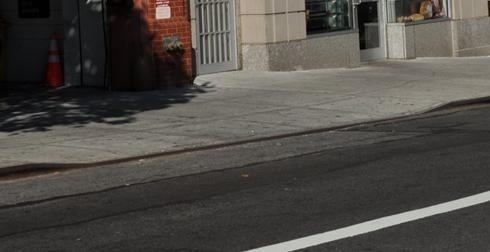

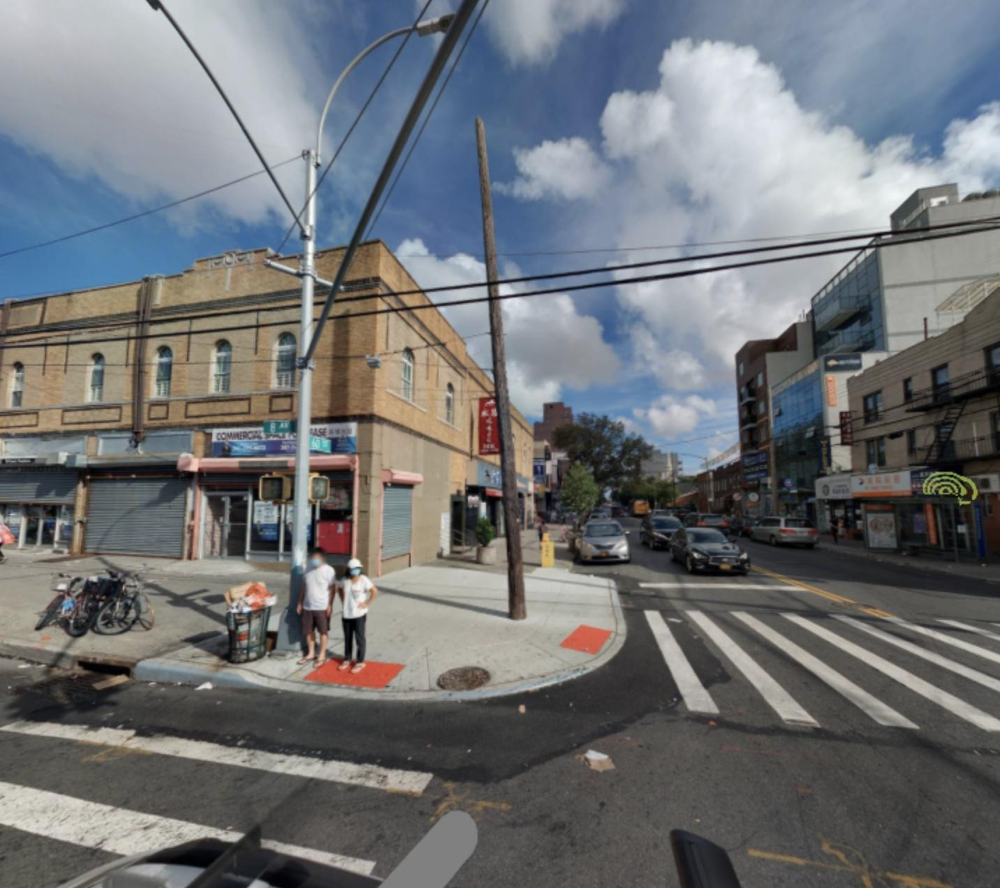

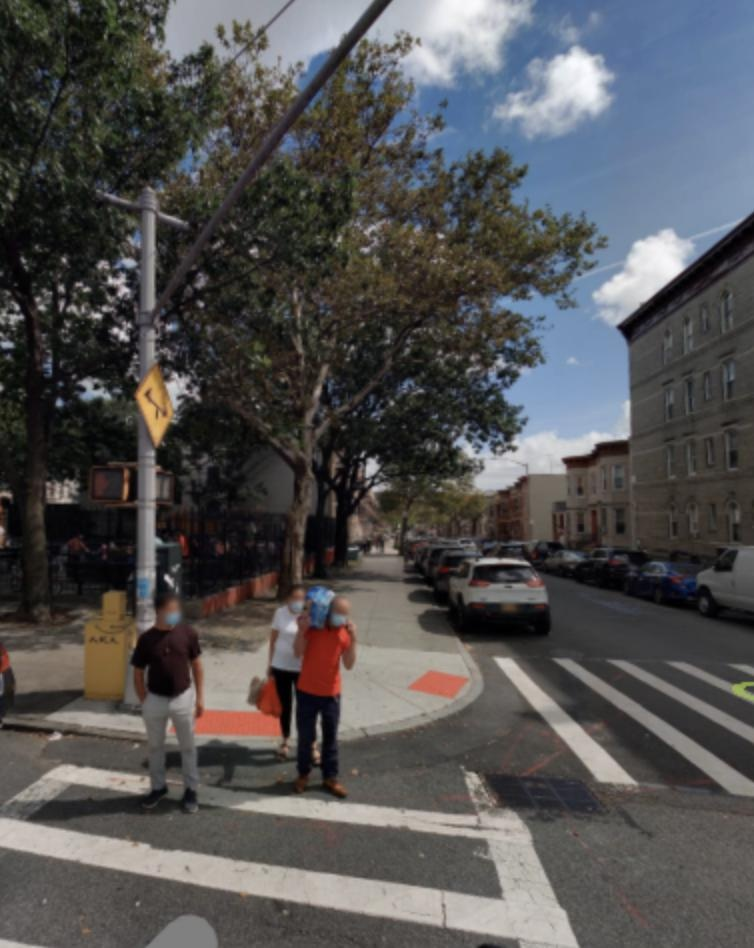

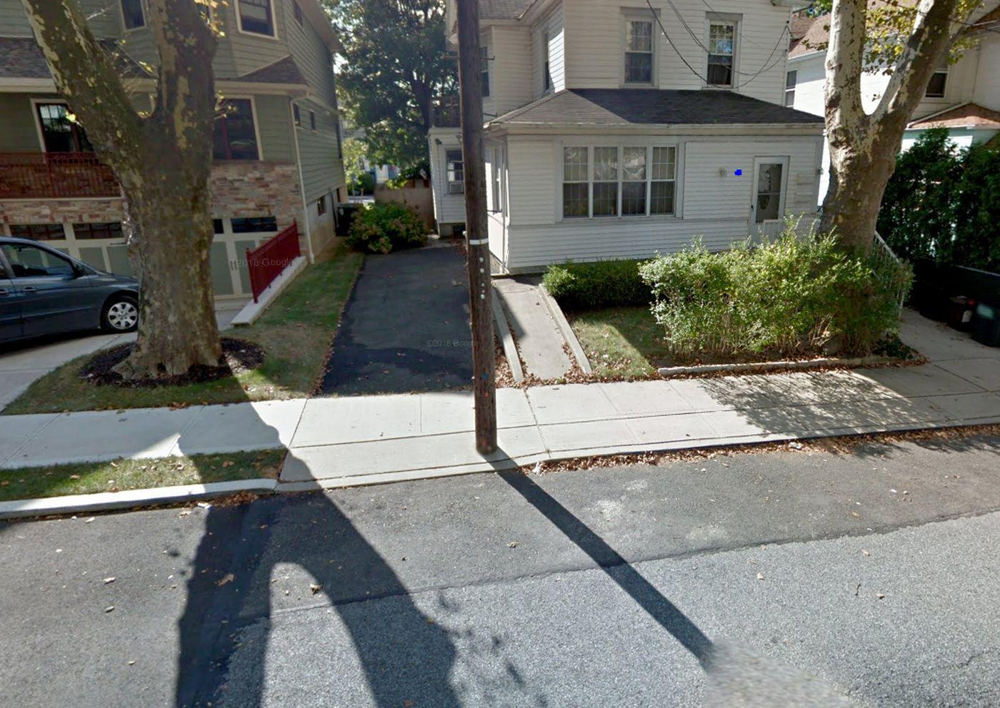

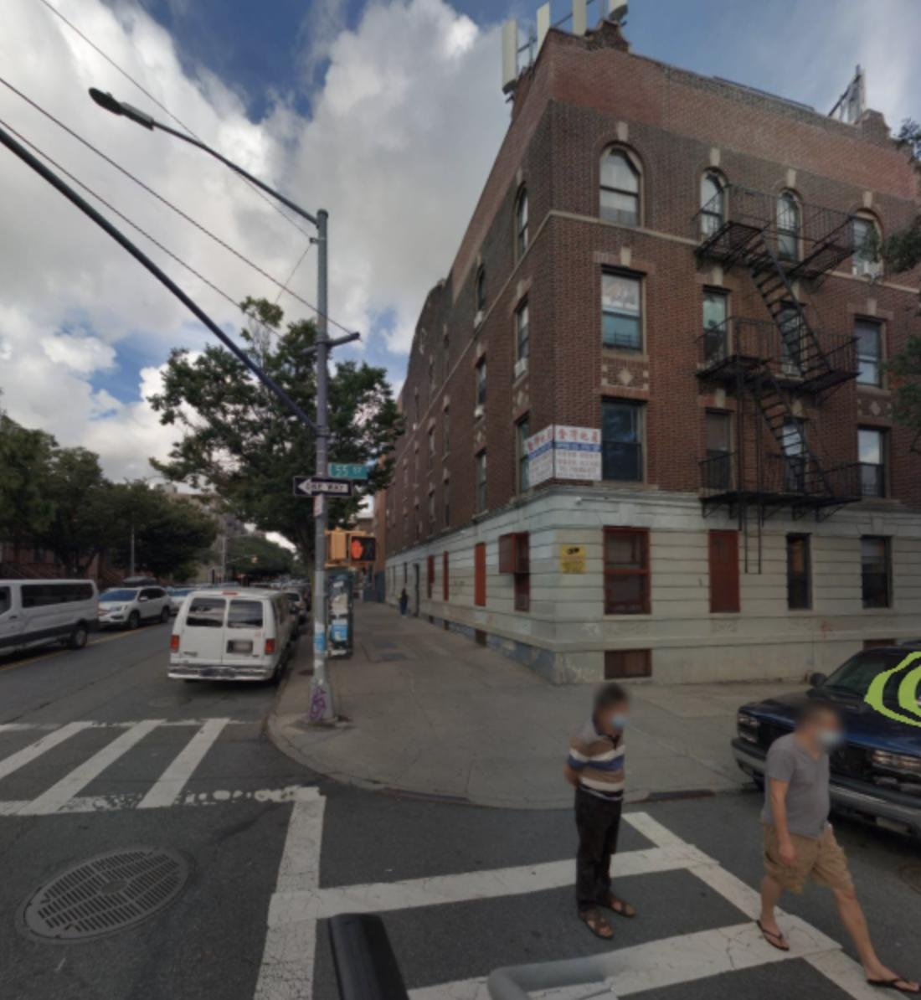

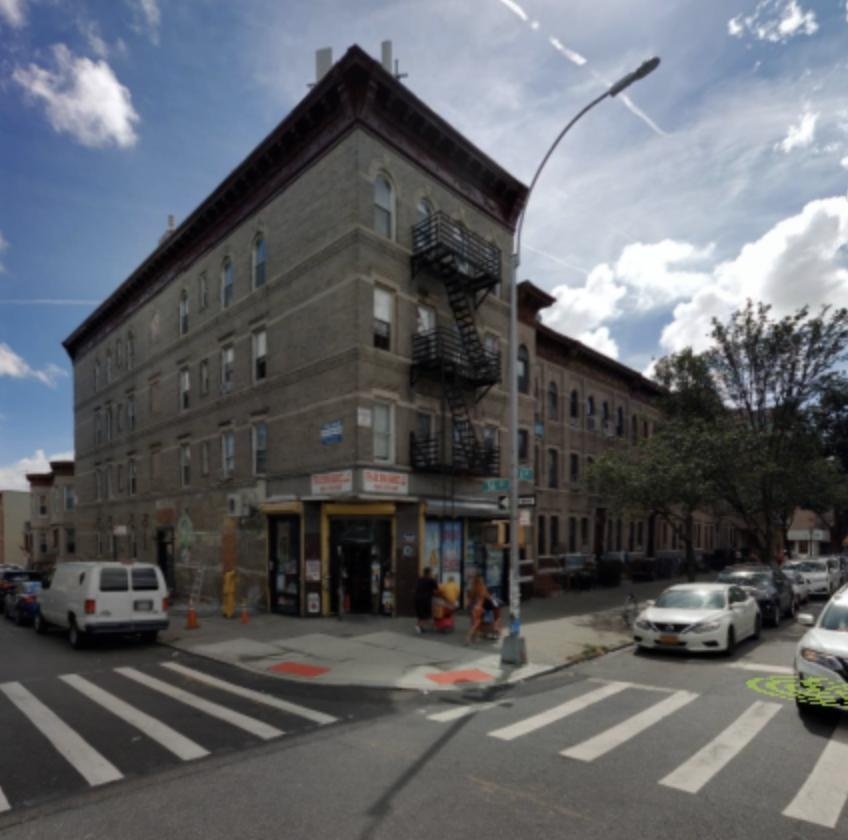

In [ ]:
# display interface on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): # assuming JPG
  i += 1 

  if i < 10:
    display(Image(filename=imageName))
    print("\n")